In [1]:
import torch
import numpy as np
from omegaconf import OmegaConf
from typing import Any
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os
from pathlib import Path
from PIL import Image


In [2]:
save_dir = Path("/home/erogullari/Workspace/cav-disentanglement/media/activation_steering")
results_dir = Path("/home/erogullari/Workspace/cav-disentanglement/results/activation_steering/celeba/decodings")
pattern_cav_dir = results_dir / "pattern_cav"
multi_cav_dir = results_dir / "multi_cav"
alphas = ["0.01", "0.1", "1", "10", "100"]
img_ids = list(range(20))
step_sizes = ["0", "0.5", "1", "1.5", "2", "2.5", "3", "3.5", "4", "4.5", "5"]

## 0. Visalization Functions

In [3]:
def plot_alpha_grid(alpha, cav_kind, img_ids=img_ids,
                    step_sizes=step_sizes, figsize=(18, 32), save_path=None):
    step_sizes = sorted(step_sizes, key=float)
    base = results_dir / cav_kind / f"alpha{alpha}"

    n_rows, n_cols = len(img_ids), len(step_sizes) + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, squeeze=False)

    for r, img_id in enumerate(img_ids):
        img_dir = base / f"img{img_id}"
        # first column: original
        axes[r, 0].imshow(Image.open(img_dir / "original.png"))
        axes[r, 0].axis("off")
        axes[r, 0].set_ylabel(f"img {img_id}", rotation=0, labelpad=28)

        for c, ss in enumerate(step_sizes, start=1):
            path = img_dir / f"step_size{ss}.png"
            if path.exists():
                axes[r, c].imshow(Image.open(path))
            axes[r, c].axis("off")
            if r == 0:
                axes[r, c].set_title(f"step {ss}")
    
    if save_path is not None:
        png_path = save_path.with_name(save_path.name + ".png")
        pdf_path = save_path.with_name(save_path.name + ".pdf")
        plt.savefig(png_path, bbox_inches="tight", format="png", dpi=300)
        plt.savefig(pdf_path, bbox_inches="tight", format="pdf", dpi=300)


    plt.tight_layout()

    return fig

## 1. Pattern CAV

### Baseline

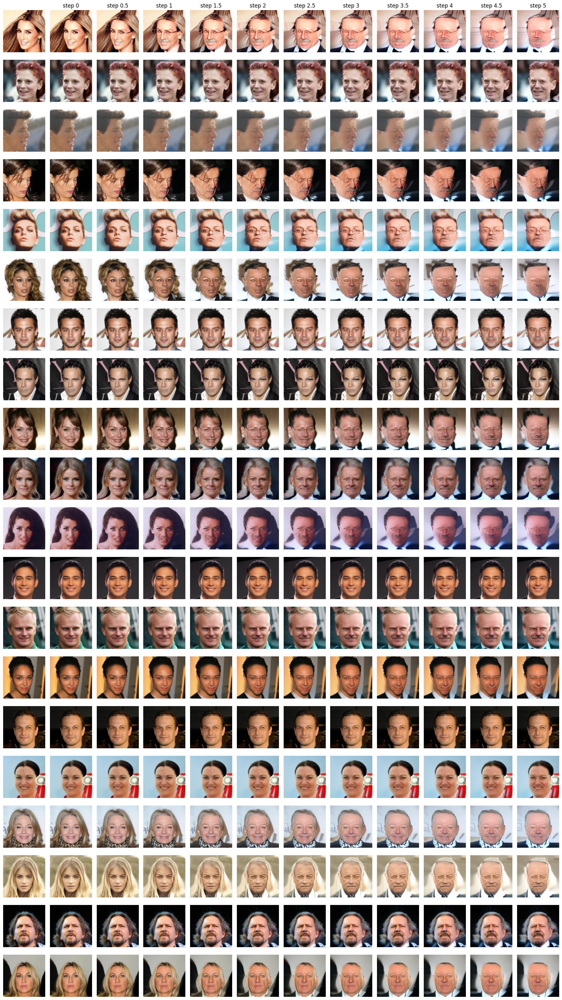

In [ ]:
cav_type = "pattern_cav"
alpha = "0"
save_path = save_dir / f"{cav_type}_alpha{alpha}"
_ = plot_alpha_grid(alpha=alpha, cav_kind=cav_type, save_path=save_path)

### Orthogonalized

In [ ]:
for alpha in alphas:
    cav_type = "pattern_cav"
    save_path = save_dir / f"{cav_type}_alpha{alpha}"
    _ = plot_alpha_grid(alpha=alpha, cav_kind=cav_type, save_path=save_path)

## 2. Multi-Pattern CAV

### Baseline

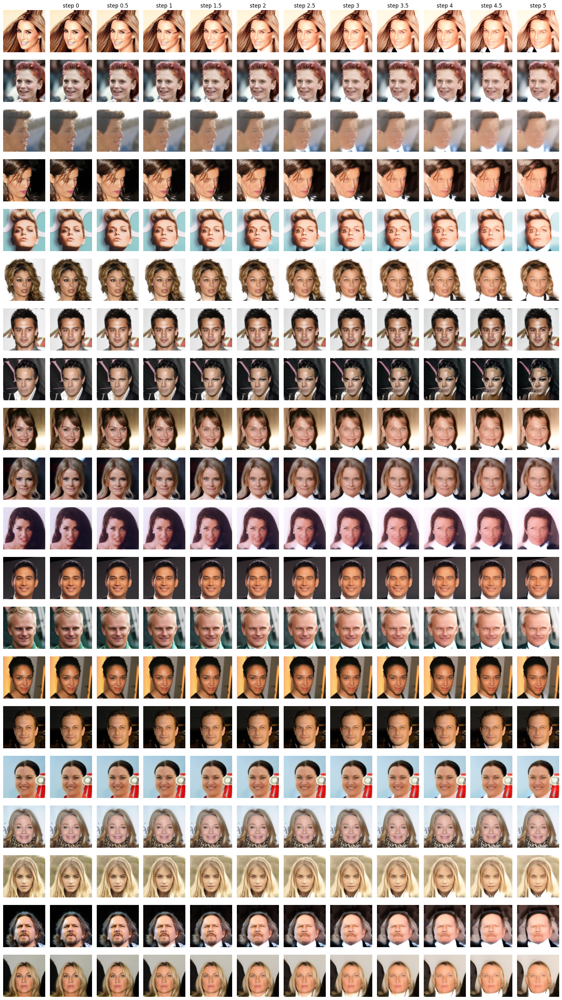

In [4]:
cav_type = "multi_cav"
alpha = "0"
save_path = save_dir / f"{cav_type}_alpha{alpha}"
_ = plot_alpha_grid(alpha=alpha, cav_kind=cav_type, save_path=save_path)

### Orthogonalized

In [ ]:
for alpha in alphas:
    cav_type = "multi_cav"
    save_path = save_dir / f"{cav_type}_alpha{alpha}"
    _ = plot_alpha_grid(alpha=alpha, cav_kind=cav_type, save_path=save_path)